# Updating UMAPs

In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import muon as mu


sc.settings.verbosity = 3
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['pdf.fonttype'] = 'truetype'

2025-07-01 16:33:24.402578: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-01 16:33:24.524430: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-01 16:33:24.623246: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751351604.770708   76761 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751351604.803866   76761 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-01 16:33:25.049678: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

## Updating patient colors

In [2]:
adata = sc.read_h5ad("17052025_celltypev3_mutations.h5ad")

In [6]:
fig, ax = plt.subplots(1,1, figsize=(5,5))

sc.pl.umap(adata, color="patient_alias", ax=ax, show=False)
ax.set_rasterization_zorder(0)
fig.savefig("figures/patient_alias_new_colors_UMAP.pdf", dpi=200, bbox_inches = "tight")
plt.close()

## Updating progression plots per patient

In [9]:
adata.obs['disease_state'].value_counts()

disease_state
MDS        37624
Healthy      607
Name: count, dtype: int64

In [4]:
newdf=pd.DataFrame({
    "X_coord_umap":adata.obsm["X_umap"][:,0],
    "Y_coord_umap":adata.obsm["X_umap"][:,1],
    "celltype":adata.obs["celltype_v2"],
    "outcome_C6D28":adata.obs["outcome_C6D28"],
    'outcome_C12D29':adata.obs["outcome_C12D29"],
    "timepoint_coarse":adata.obs["timepoint_coarse"],
    "patient":adata.obs["patient"],
    "patient_alias": adata.obs["patient_alias"],
})
newdf

,X_coord_umap,Y_coord_umap,celltype,outcome_C6D28,outcome_C12D29,timepoint_coarse,patient,patient_alias
hashtag_C1D1_AAACCTGAGAAGAAGC-1,10.981606,12.418462,Atypical cluster E,Responder,Responder,pre,61289001,P11
hashtag_C1D1_AAACCTGAGCGTTTAC-1,12.689439,3.141997,HSC,Responder,Responder,pre,61213005,P12
hashtag_C1D1_AAACCTGCAAATCCGT-1,10.337970,12.174479,Atypical cluster E,Responder,Responder,pre,61289001,P11
hashtag_C1D1_AAACCTGGTCCAACTA-1,8.816384,7.991989,GMP,Responder,Responder,pre,61213005,P12
hashtag_C1D1_AAACGGGCACCATCCT-1,11.258220,14.470355,Atypical cluster F,Responder,Responder,pre,61213005,P12
...,...,...,...,...,...,...,...,...
Pool7_TTCTACATCCTTTCGG-1,7.360431,14.479185,Monocyte progenitor,Responder,Responder,mid,61213011,P03
Pool7_TTCTCAAAGTCCCACG-1,4.390059,-5.537665,Erythroblast,Responder,Responder,mid,61213011,P03
Pool7_TTCTCAATCGCAAGCC-1,5.326890,-6.119246,Erythroblast,Responder,Responder,mid,61213011,P03
Pool7_TTGAACGAGAGCAATT-1,5.478138,14.661095,Monocyte progenitor,Responder,Responder,mid,61213011,P03


In [34]:
from MDS_figure2_dicts import *

In [31]:
patient_alias_colors

{'P01': '#1f77b4',
 'P02': '#ff7f0e',
 'P03': '#d62728',
 'P08': '#9467bd',
 'P09': '#2ca02c',
 'P11': '#8c564b',
 'P12': '#bcbd22',
 'P17': '#e377c2',
 'P18': '#17becf',
 'control1': '#ff7f0e',
 'control2': '#2ca02c',
 'control3': '#d62728',
 'control4': '#9467bd',
 'control5': '#1f77b4'}

In [ ]:
newdf['ctgrey'] = "#c8c8c8"

In [6]:
titles1=['C1D1','C7D1','C12D29']
titles2=['C1D1','C7D1','AML Progression post C6']

### Responders

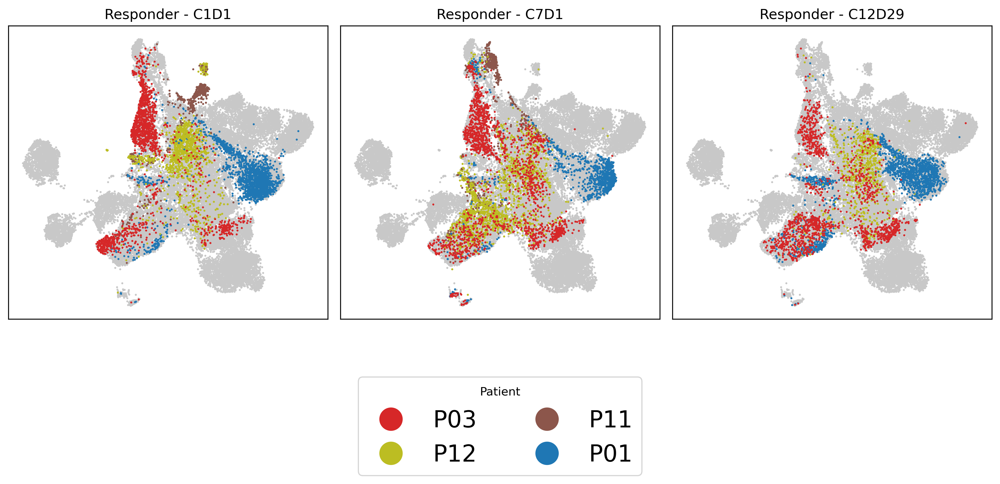

In [15]:
import matplotlib.lines as mlines

# Row 1

fig, axes = plt.subplots(1, 3, figsize=(12, 4), dpi=300)

# List to store unique patient aliases and their associated colors for the legend
unique_patient_aliases = []

for j, timepoint in enumerate(['pre', 'mid', 'post']):
    ax = axes[j]
    
    # Background scatter plot (grey points)
    ax.scatter(
        newdf['X_coord_umap'], 
        newdf['Y_coord_umap'], 
        c=newdf['ctgrey'], 
        s=0.5, 
        rasterized=True  # Rasterizing background points
    )
    
    # Filtering data
    df = newdf[newdf['outcome_C6D28'] == "Responder"]
    data = df[(df['outcome_C12D29'] == "Responder") & (df['timepoint_coarse'] == timepoint)]
    data['patient_alias'] = data['patient_alias'].cat.remove_unused_categories()

    # Plotting the filtered data
    scatter = ax.scatter(
        data['X_coord_umap'], 
        data['Y_coord_umap'], 
        c=[patient_alias_colors[alias] for alias in data['patient_alias']], 
        s=3,
        edgecolor='none',
        rasterized=True  # Enable rasterization for the scatter plot
    )

    # Collect unique patient aliases across all timepoints
    unique_patient_aliases.extend(data['patient_alias'].unique())

    # Set title
    plottitle = 'Responder - ' + titles1[j]
    ax.set_title(plottitle)
    
    # Remove grid and axis labels
    ax.grid(False)
    ax.legend().set_visible(False)  # Hide subplot legends
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

# Remove duplicates from the unique_patient_aliases list
unique_patient_aliases = list(set(unique_patient_aliases))

# Create the legend handles for unique patients
legend_handles = [
    mlines.Line2D([], [], marker='o', color='w', markerfacecolor=patient_alias_colors[alias], markersize=3, label=alias)
    for alias in unique_patient_aliases
]

# Create a single legend outside the figure using the stored handles
fig.legend(
    legend_handles, 
    [handle.get_label() for handle in legend_handles],  # Extracting the labels from the handles
    title='Patient', 
    markerscale=7, 
    fontsize=20, 
    loc='upper center', 
    bbox_to_anchor=(0.5, -0.1), 
    ncol=2
)

# Adjust layout and save with rasterization enabled
fig.tight_layout()
fig.savefig("figures/row1_responder_responder_UMAP_v2.png", format="png", bbox_inches='tight')
fig.savefig("figures/row1_responder_responder_UMAP_v2.pdf", format="pdf", bbox_inches='tight')


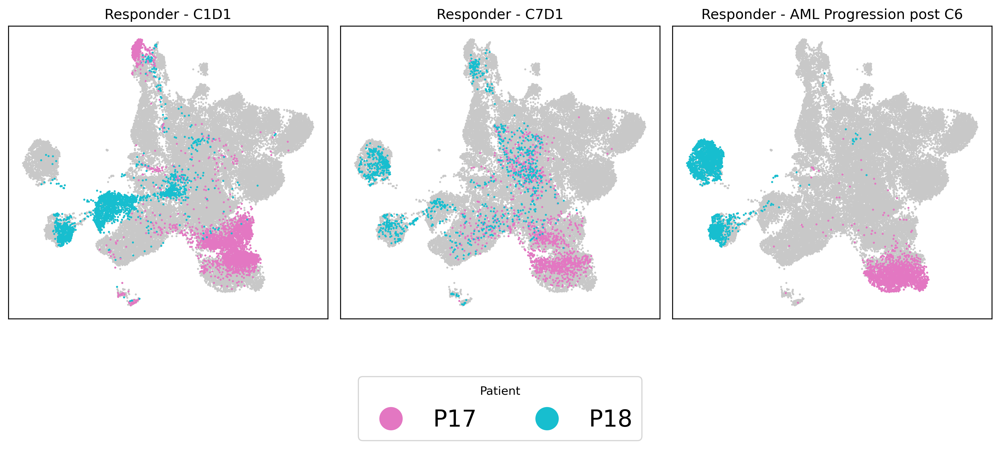

In [16]:
# Row 2
fig, axes = plt.subplots(1, 3, figsize=(12, 4), dpi=300)

# List to store unique patient aliases and their associated colors for the legend
unique_patient_aliases = []

for j, timepoint in enumerate(['pre', 'mid', 'progression']):
    ax = axes[j]
    
    # Background scatter plot (grey points)
    ax.scatter(
        newdf['X_coord_umap'], 
        newdf['Y_coord_umap'], 
        c=newdf['ctgrey'], 
        s=0.5, 
        rasterized=True  # Rasterizing background points
    )
    
    # Filtering data
    df = newdf[newdf['outcome_C6D28'] == "Responder"]
    data = df[(df['outcome_C12D29'] == "Progression") & (df['timepoint_coarse'] == timepoint)]
    data['patient_alias'] = data['patient_alias'].cat.remove_unused_categories()
    
    # Plotting the filtered data
    scatter = ax.scatter(
        data['X_coord_umap'], 
        data['Y_coord_umap'], 
        c=[patient_alias_colors[alias] for alias in data['patient_alias']], 
        s=3,
        edgecolor='none',
        rasterized=True  # Enable rasterization for the scatter plot
    )

    # Collect unique patient aliases across all timepoints
    unique_patient_aliases.extend(data['patient_alias'].unique())

    # Set title
    plottitle = 'Responder - ' + titles2[j]
    ax.set_title(plottitle)
    
    # Remove grid and axis labels
    ax.grid(False)
    ax.legend().set_visible(False)  # Hide subplot legends
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

# Remove duplicates from the unique_patient_aliases list
unique_patient_aliases = list(set(unique_patient_aliases))

# Create the legend handles for unique patients
legend_handles = [
    mlines.Line2D([], [], marker='o', color='w', markerfacecolor=patient_alias_colors[alias], markersize=3, label=alias)
    for alias in unique_patient_aliases
]

# Create a single legend outside the figure using the stored handles
fig.legend(
    legend_handles, 
    [handle.get_label() for handle in legend_handles],  # Extracting the labels from the handles
    title='Patient', 
    markerscale=7, 
    fontsize=20, 
    loc='upper center', 
    bbox_to_anchor=(0.5, -0.1), 
    ncol=3
)

# Adjust layout and save with rasterization enabled
fig.tight_layout()
fig.savefig("figures/row2_responder_progression_UMAP_v2.png", format="png", bbox_inches='tight', dpi=300)
fig.savefig("figures/row2_responder_progression_UMAP_v2.pdf", format="pdf", bbox_inches='tight')


### Non-responders

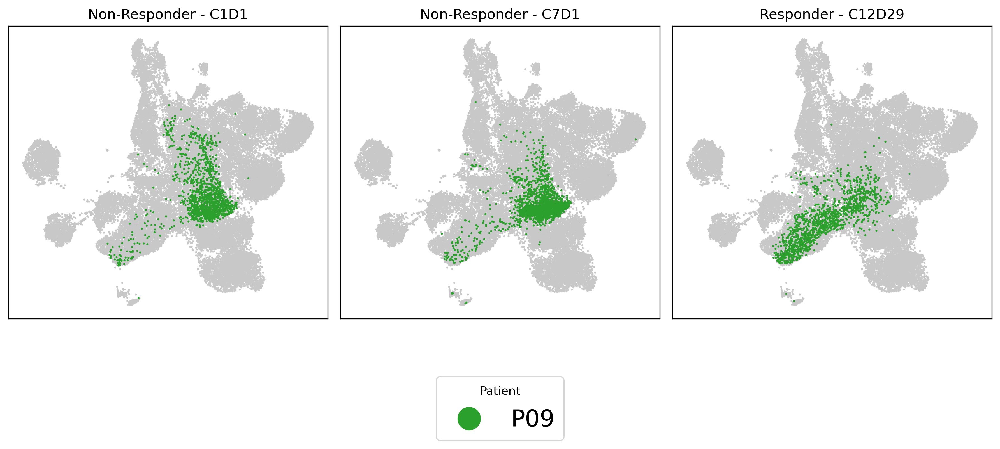

In [17]:
#Row 3
fig, axes = plt.subplots(1, 3, figsize=(12, 4), dpi=300)
ptt = ['Non-Responder - C1D1', 'Non-Responder - C7D1', 'Responder - C12D29']

# List to store unique patient aliases and their associated colors for the legend
unique_patient_aliases = []

for j, timepoint in enumerate(['pre', 'mid', 'post']):
    ax = axes[j]
    
    # Background scatter plot (grey points)
    ax.scatter(
        newdf['X_coord_umap'], 
        newdf['Y_coord_umap'], 
        c=newdf['ctgrey'], 
        s=0.5, 
        rasterized=True  # Rasterizing background points
    )
    
    # Filtering data
    df = newdf[newdf['outcome_C6D28'] == "Non-Responder"]
    data = df[(df['outcome_C12D29'] == "Responder") & (df['timepoint_coarse'] == timepoint)]
    data['patient_alias'] = data['patient_alias'].cat.remove_unused_categories()
    
    # Plotting the filtered data
    scatter = ax.scatter(
        data['X_coord_umap'], 
        data['Y_coord_umap'], 
        c=[patient_alias_colors[alias] for alias in data['patient_alias']], 
        s=3,
        edgecolor='none',
        rasterized=True  # Enable rasterization for the scatter plot
    )

    # Collect unique patient aliases across all timepoints
    unique_patient_aliases.extend(data['patient_alias'].unique())

    # Set title
    ax.set_title(ptt[j])
    
    # Remove grid and axis labels
    ax.grid(False)
    ax.legend().set_visible(False)  # Hide subplot legends
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

# Remove duplicates from the unique_patient_aliases list
unique_patient_aliases = list(set(unique_patient_aliases))

# Create the legend handles for unique patients
legend_handles = [
    mlines.Line2D([], [], marker='o', color='w', markerfacecolor=patient_alias_colors[alias], markersize=3, label=alias)
    for alias in unique_patient_aliases
]

# Create a single legend outside the figure using the stored handles
fig.legend(
    legend_handles, 
    [handle.get_label() for handle in legend_handles],  # Extracting the labels from the handles
    title='Patient', 
    markerscale=7, 
    fontsize=20, 
    loc='upper center', 
    bbox_to_anchor=(0.5, -0.1), 
    ncol=3
)

# Adjust layout and save with rasterization enabled
fig.tight_layout()
fig.savefig("figures/row3_nonresponder_responder_UMAP_v2.png", format="png", bbox_inches='tight')
fig.savefig("figures/row3_nonresponder_responder_UMAP_v2.pdf", format="pdf", bbox_inches='tight')


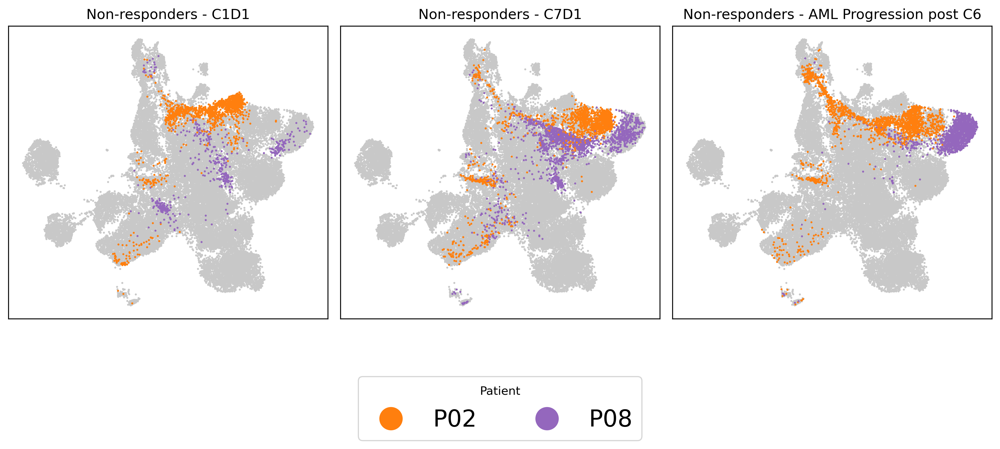

In [18]:
#Row 4

fig, axes = plt.subplots(1, 3, figsize=(12, 4), dpi=300)

# List to store unique patient aliases and their associated colors for the legend
unique_patient_aliases = []

for j, timepoint in enumerate(['pre', 'mid', 'progression']):
    ax = axes[j]
    
    # Background scatter plot (grey points)
    ax.scatter(
        newdf['X_coord_umap'], 
        newdf['Y_coord_umap'], 
        c=newdf['ctgrey'], 
        s=0.5, 
        rasterized=True  # Rasterized background points
    )
    
    # Filter relevant data
    df = newdf[newdf['outcome_C6D28'] == "Non-Responder"]
    data = df[(df['outcome_C12D29'] == "Progression") & (df['timepoint_coarse'] == timepoint)]
    data['patient_alias'] = data['patient_alias'].cat.remove_unused_categories()
    
    # Foreground scatter plot with hue
    scatter = sns.scatterplot(
        data=data, 
        x='X_coord_umap', 
        y='Y_coord_umap', 
        ax=ax, 
        hue='patient_alias', 
        palette=patient_alias_colors, 
        s=3,
        edgecolor='none'
    )

    # Collect unique patient aliases across all timepoints
    unique_patient_aliases.extend(data['patient_alias'].unique())

    # Apply rasterization to foreground scatter points
    for collection in scatter.collections:
        collection.set_rasterized(True)  

    # Set title
    ax.set_title(f'Non-responders - {titles2[j]}')
    
    # Remove grid and axis labels
    ax.grid(False)
    ax.legend().set_visible(False)  # Hide subplot legends
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

# Remove duplicates from the unique_patient_aliases list
unique_patient_aliases = list(set(unique_patient_aliases))

# Create the legend handles for unique patients
legend_handles = [
    mlines.Line2D([], [], marker='o', color='w', markerfacecolor=patient_alias_colors[alias], markersize=3, label=alias)
    for alias in unique_patient_aliases
]

# Create a single legend outside the figure using the stored handles
fig.legend(
    legend_handles, 
    [handle.get_label() for handle in legend_handles],  # Extracting the labels from the handles
    title='Patient', 
    markerscale=7, 
    fontsize=20, 
    loc='upper center', 
    bbox_to_anchor=(0.5, -0.1), 
    ncol=3
)

# Adjust layout and save with rasterization enabled
fig.tight_layout()
fig.savefig("figures/row4_nonresponders_progression_UMAP_v2.png", format="png", bbox_inches='tight')
fig.savefig("figures/row4_nonresponders_progression_UMAP_v2.pdf", format="pdf", bbox_inches='tight')


## Healthy celltypes in grey to highlight ATC

In [8]:
healthy_ct = ["HSC", 'MPP', 'MEP/MKP', 'MEP', 'Erythroblast', 'BMCP','GMP','Monocyte progenitor']

In [6]:
adata.obs['celltype_v2'].cat.categories

Index(['Atypical cluster A', 'Atypical cluster B', 'Atypical cluster C',
       'Atypical cluster D', 'Atypical cluster E', 'Atypical cluster F',
       'Atypical cluster G', 'Atypical cluster H', 'Atypical cluster I',
       'Atypical cluster J', 'Atypical cluster K', 'Atypical cluster L',
       'Atypical cluster M', 'Atypical cluster N', 'Atypical cluster O',
       'BMCP', 'Erythroblast', 'GMP', 'HSC', 'MEP', 'MEP/MKP', 'MPP',
       'Monocyte progenitor'],
      dtype='object')

In [7]:
 celltype_v2_with_grey= ['#023fa5', '#7d87b9', '#bec1d4', '#d6bcc0', '#bb7784', '#8e063b',
        '#4a6fe3', '#8595e1', '#b5bbe3', '#e6afb9', '#e07b91', '#d33f6a',
        '#11c638', '#8dd593', '#c6dec7', '#808080', '#808080', '#808080',
        '#808080', '#808080', '#808080', '#808080', '#808080']

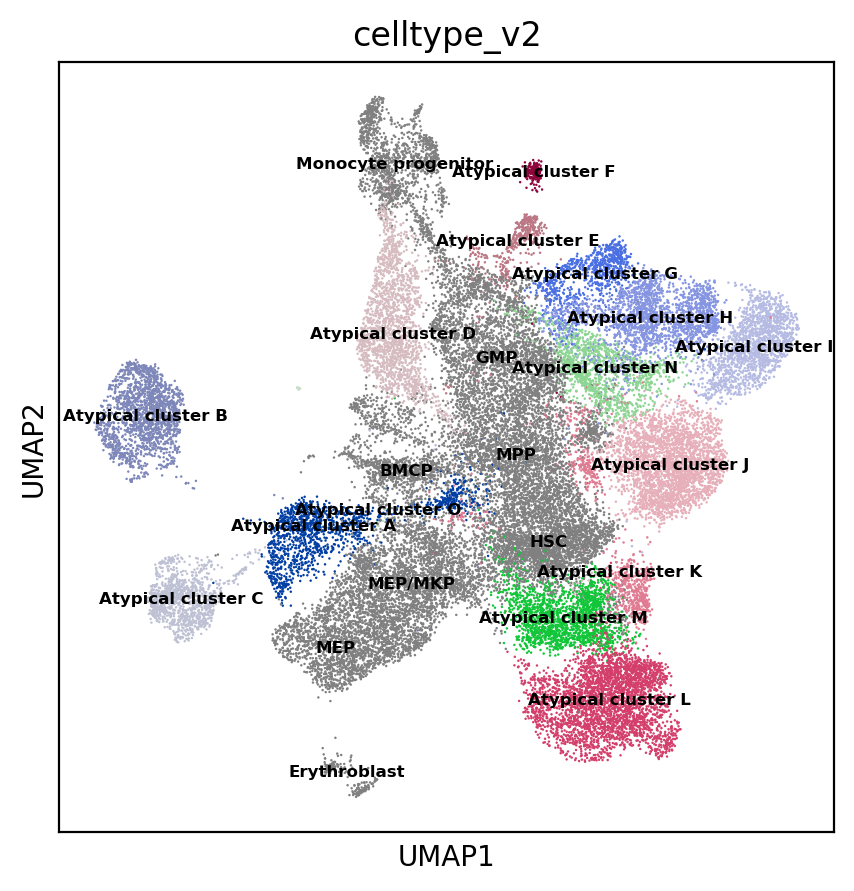

In [12]:
fig, ax = plt.subplots(1,1, figsize=(5,5))

sc.pl.umap(adata, color="celltype_v2", palette=celltype_v2_with_grey, legend_loc="on data", show=False, ax=ax, legend_fontsize=6)
ax.set_rasterization_zorder(0)
fig.savefig("figures/celltype_v2_healthyingrey_UMAP.pdf", dpi=200, bbox_inches = "tight")
#plt.close()



## Healthy patients in grey to highlight MDS patients

In [24]:
adata.obs['patient_alias'] = adata.obs['patient_alias'].cat.reorder_categories(['P08', 'P12', 'P03', 'P09', 'P02', 'P01', 'P11', 'P17', 'P18','C1','C2','C3','C4','C5'])

In [38]:
patient_alias_colors_withgrey = {
    "P01":"#1f77b4",
    "P02":"#ff7f0e",
    "P03":"#d62728",
    "P08":"#9467bd",
    "P09":"#2ca02c",
    "P11":"#8c564b",
    "P12":"#bcbd22",
    "P17":"#e377c2",
    "P18":"#17becf",
    'C1': '#808080',
    'C2': '#808080',
    'C3': '#808080',
    'C4': '#808080',
    'C5': '#808080'
}

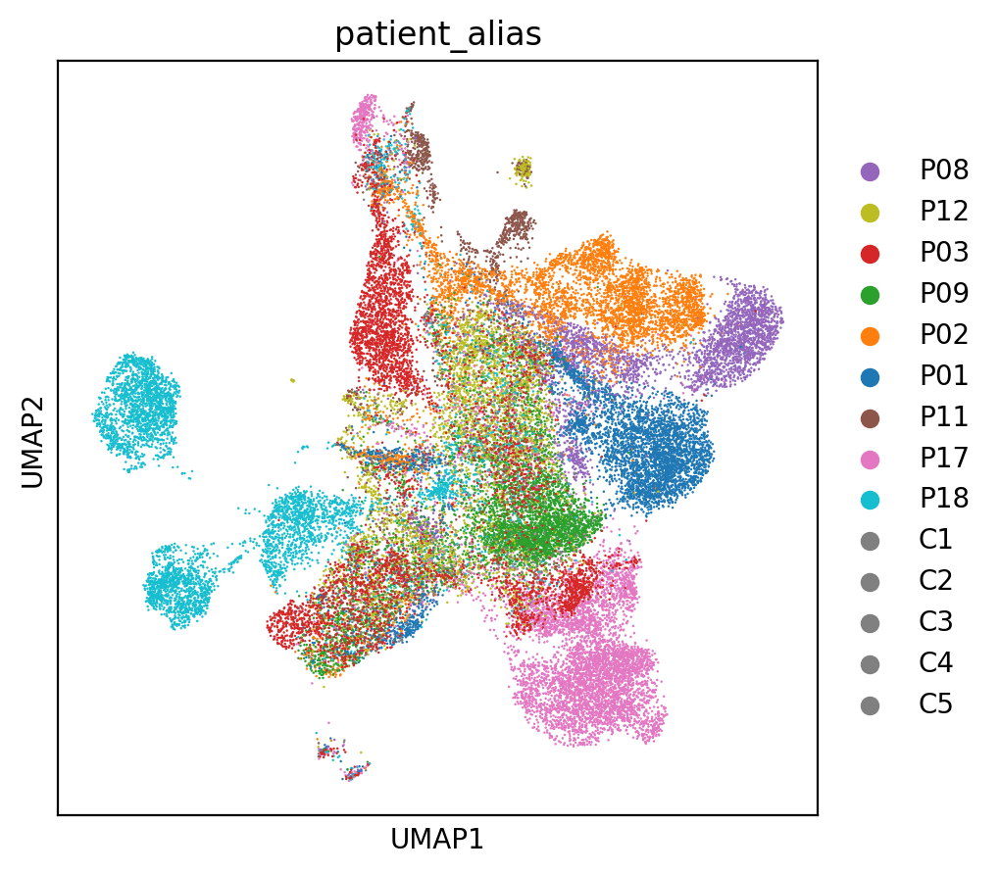

In [40]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
sc.pl.umap(adata, color='patient_alias', palette=patient_alias_colors_withgrey, ax=ax, show=False)
ax.set_rasterization_zorder(0)
fig.savefig("figures/patient_alias_healthyingrey_UMAP.pdf", dpi=200, bbox_inches = "tight")

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(5,5))

sc.pl.umap(adata, color="celltype_v2", palette=celltype_v2_with_grey, legend_loc="on data", show=False, ax=ax, legend_fontsize=6)
ax.set_rasterization_zorder(0)
fig.savefig("figures/celltype_v2_healthyingrey_UMAP.pdf", dpi=200, bbox_inches = "tight")
#plt.close()



## Atypical clusters in grey

In [42]:
adata.obs["celltype_v2"].cat.categories

Index(['Atypical cluster A', 'Atypical cluster B', 'Atypical cluster C',
       'Atypical cluster D', 'Atypical cluster E', 'Atypical cluster F',
       'Atypical cluster G', 'Atypical cluster H', 'Atypical cluster I',
       'Atypical cluster J', 'Atypical cluster K', 'Atypical cluster L',
       'Atypical cluster M', 'Atypical cluster N', 'Atypical cluster O',
       'BMCP', 'Erythroblast', 'GMP', 'HSC', 'MEP', 'MEP/MKP', 'MPP',
       'Monocyte progenitor'],
      dtype='object')

In [50]:
celltype_v2_colors_original = adata.uns['celltype_v2_colors']

In [52]:
celltype_v2_atypicalgrey = ['#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#808080',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1']

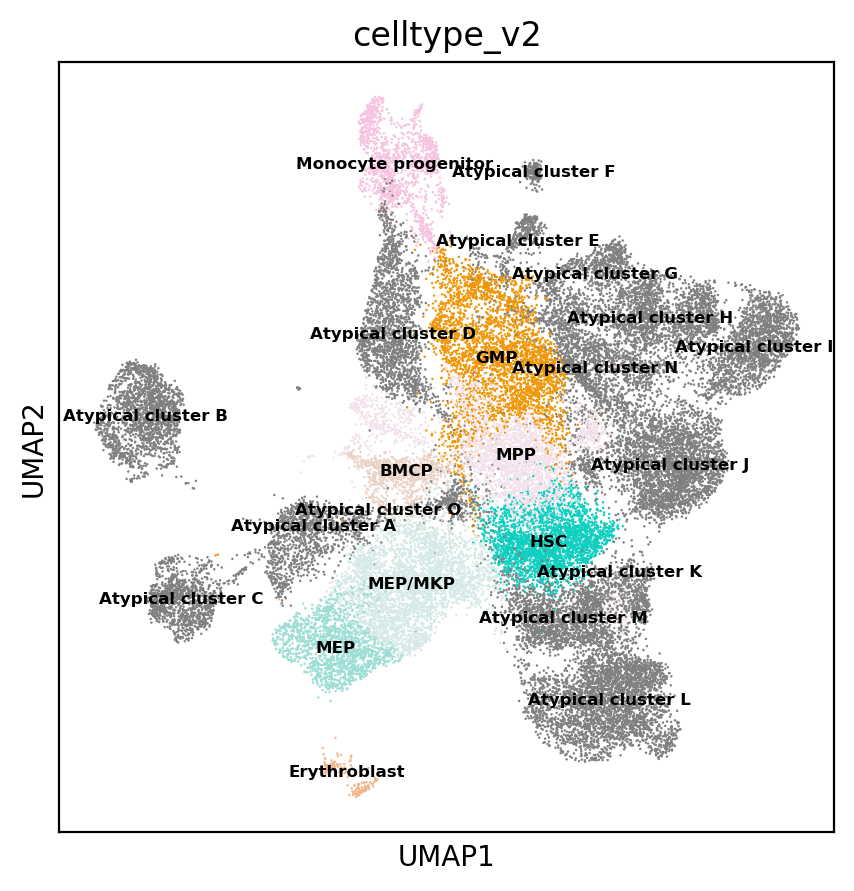

In [53]:
fig, ax = plt.subplots(1,1, figsize=(5,5))

sc.pl.umap(adata, color="celltype_v2", palette=celltype_v2_atypicalgrey, legend_loc="on data", show=False, ax=ax, legend_fontsize=6)
ax.set_rasterization_zorder(0)
fig.savefig("figures/celltype_v2_atypicalingrey_UMAP.pdf", dpi=200, bbox_inches = "tight")
#plt.close()



# MISC

In [18]:
temp_df = pd.DataFrame({
    "patient_alias":adata.obs["patient_alias"],
    "timepoint_coarse":adata.obs["timepoint_coarse"],
    "celltype_v2":adata.obs["celltype_v2"]
})
temp_df

,patient_alias,timepoint_coarse,celltype_v2
AAACCTGAGAAGAAGC-1,P11,pre,Atypical cluster E
AAACCTGAGCGTTTAC-1,P12,pre,HSC
AAACCTGCAAATCCGT-1,P11,pre,Atypical cluster E
AAACCTGGTCCAACTA-1,P12,pre,GMP
AAACGGGCACCATCCT-1,P12,pre,Atypical cluster F
...,...,...,...
TTCTACATCCTTTCGG-1,P03,mid,Monocyte progenitor
TTCTCAAAGTCCCACG-1,P03,mid,Erythroblast
TTCTCAATCGCAAGCC-1,P03,mid,Erythroblast
TTGAACGAGAGCAATT-1,P03,mid,Monocyte progenitor


In [21]:
grouped_counts = temp_df.groupby(['patient_alias', 'timepoint_coarse', 'celltype_v2']).size().reset_index(name='count')
grouped_counts = grouped_counts[grouped_counts['count']>0].copy()
grouped_counts

,patient_alias,timepoint_coarse,celltype_v2,count
84,C5,Healthy,BMCP,3
85,C5,Healthy,Erythroblast,10
86,C5,Healthy,GMP,28
87,C5,Healthy,HSC,36
88,C5,Healthy,MEP,8
...,...,...,...,...
1471,C4,Healthy,Monocyte progenitor,9
1580,C3,Healthy,Erythroblast,1
1583,C3,Healthy,MEP,3
1584,C3,Healthy,MEP/MKP,2


In [22]:
grouped_counts.to_csv("MDS_paper_grouped_counts.csv", index=False)

# New celltype colours

In [12]:
new_celltype_colors = {
    "Atypical cluster A": "#e2b9c4",
    "Atypical cluster B": "#9e163c",
    "Atypical cluster C": "#c5738a",
    "Atypical cluster D": "#905898",
    "Atypical cluster E": "#bf565d",
    "Atypical cluster F": "#cb7b26",
    "Atypical cluster G": "#a6c1d5",
    "Atypical cluster H": "#4d83ab",
    "Atypical cluster I": "#cbc106",
    "Atypical cluster J": "#7b906f",
    "Atypical cluster K": "#bbd2c6",
    "Atypical cluster L": "#1c6840",
    "Atypical cluster M": "#77a48c",
    "Atypical cluster N": "#389ca7",
    "Atypical cluster O": "#ffffff",
    "HSC": "#c098b0",
    "MPP": "#583070",
    "MEP/MKP": "#ffb651",
    "MEP": "#d85a44",
    "Erythroblast": "#aa3f5d",
    "BMCP": "#bcd1d4",
    "GMP": "#79a3aa",
    "Monocyte progenitor": "#206671"
}

other_celltype_colors={
    "Patient specific cluster": "#808080",
    "Healthy cluster": "#d3d3d3",
    "Atypical cluster": "#808080"
}

misc_colors={
   "Responder": "#115284",
    "Non-responder": "#fe9003",
    "Baseline": "#515558"
}

all_colors= new_celltype_colors | other_celltype_colors | misc_colors

In [11]:
atypical_ct=[
    "Atypical cluster A",
    "Atypical cluster B",
    "Atypical cluster C",
    "Atypical cluster D",
    "Atypical cluster E",
    "Atypical cluster F",
    "Atypical cluster G",
    "Atypical cluster H",
    "Atypical cluster I",
    "Atypical cluster J",
    "Atypical cluster K",
    "Atypical cluster L",
    "Atypical cluster M",
    "Atypical cluster N",
    "Atypical cluster O",
]

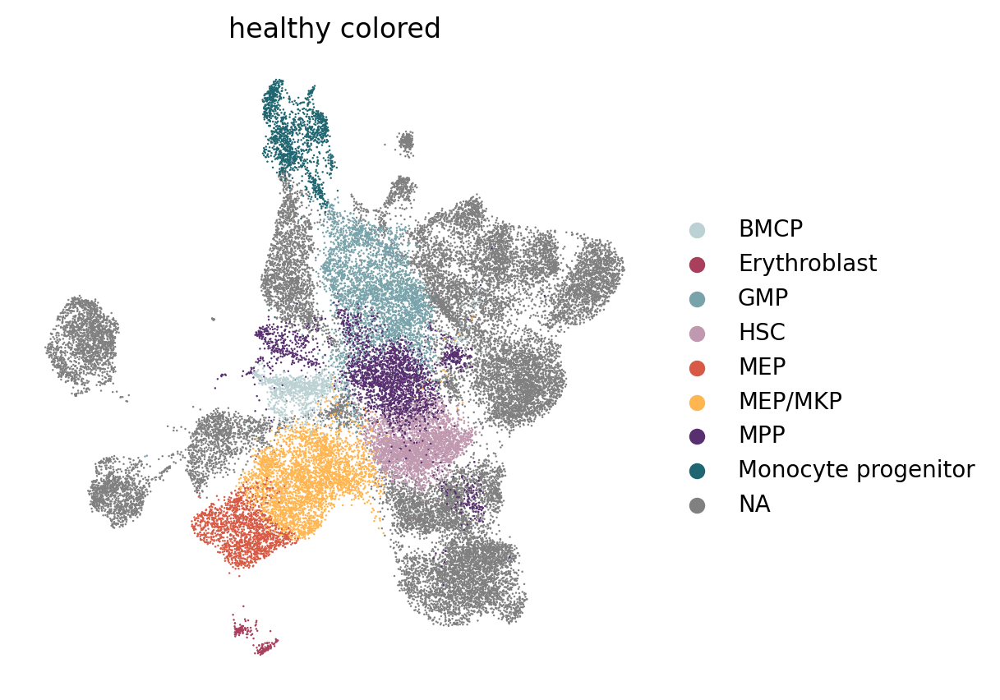

In [20]:
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.umap(adata, 
           color=['celltype_v2'], 
           groups=healthy_ct,
           palette=all_colors, 
           na_color="#808080", 
           ax=ax, 
           show=False, 
           title="healthy colored",
           frameon=False)
ax.set_rasterization_zorder(0)
fig.savefig("figures/mastercolors_v1_healthy_UMAP.pdf", dpi=200, bbox_inches = "tight")

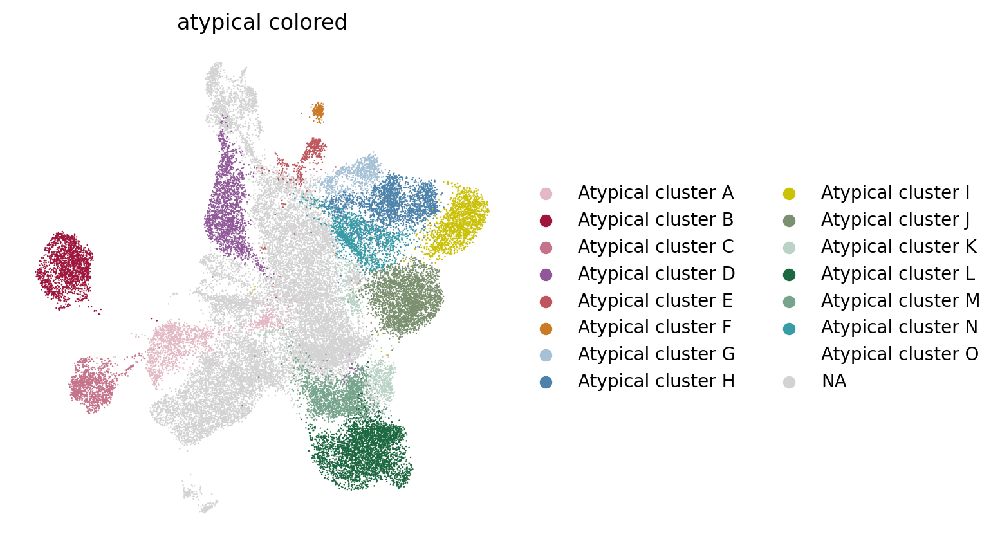

In [26]:
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.umap(adata, 
           color=['celltype_v2'], 
           groups=atypical_ct,
           palette=all_colors, 
           na_color="#d3d3d3", 
           ax=ax, 
           show=False, 
           title="atypical colored",
           frameon=False)
ax.set_rasterization_zorder(0)
fig.savefig("figures/mastercolors_v1_atypical_UMAP.pdf", dpi=200, bbox_inches = "tight")

## Patient by patient

In [16]:
newdf=pd.DataFrame({
    "X_coord_umap":adata.obsm["X_umap"][:,0],
    "Y_coord_umap":adata.obsm["X_umap"][:,1],
    "celltype":adata.obs["celltype_v2"],
    "outcome_C6D28":adata.obs["outcome_C6D28"],
    'outcome_C12D29':adata.obs["outcome_C12D29"],
    "timepoint_coarse":adata.obs["timepoint_coarse"],
    "patient":adata.obs["patient"],
    "patient_alias": adata.obs["patient_alias"],
})
newdf

,X_coord_umap,Y_coord_umap,celltype,outcome_C6D28,outcome_C12D29,timepoint_coarse,patient,patient_alias
hashtag_C1D1_AAACCTGAGAAGAAGC-1,10.981606,12.418462,Atypical cluster E,Responder,Responder,pre,61289001,P11
hashtag_C1D1_AAACCTGAGCGTTTAC-1,12.689439,3.141997,HSC,Responder,Responder,pre,61213005,P12
hashtag_C1D1_AAACCTGCAAATCCGT-1,10.337970,12.174479,Atypical cluster E,Responder,Responder,pre,61289001,P11
hashtag_C1D1_AAACCTGGTCCAACTA-1,8.816384,7.991989,GMP,Responder,Responder,pre,61213005,P12
hashtag_C1D1_AAACGGGCACCATCCT-1,11.258220,14.470355,Atypical cluster F,Responder,Responder,pre,61213005,P12
...,...,...,...,...,...,...,...,...
Pool7_TTCTACATCCTTTCGG-1,7.360431,14.479185,Monocyte progenitor,Responder,Responder,mid,61213011,P03
Pool7_TTCTCAAAGTCCCACG-1,4.390059,-5.537665,Erythroblast,Responder,Responder,mid,61213011,P03
Pool7_TTCTCAATCGCAAGCC-1,5.326890,-6.119246,Erythroblast,Responder,Responder,mid,61213011,P03
Pool7_TTGAACGAGAGCAATT-1,5.478138,14.661095,Monocyte progenitor,Responder,Responder,mid,61213011,P03


In [17]:
healthy_pat = ['C1','C2','C3','C4','C5']
newdf = newdf[~newdf['patient_alias'].isin(healthy_pat)]
newdf

,X_coord_umap,Y_coord_umap,celltype,outcome_C6D28,outcome_C12D29,timepoint_coarse,patient,patient_alias
hashtag_C1D1_AAACCTGAGAAGAAGC-1,10.981606,12.418462,Atypical cluster E,Responder,Responder,pre,61289001,P11
hashtag_C1D1_AAACCTGAGCGTTTAC-1,12.689439,3.141997,HSC,Responder,Responder,pre,61213005,P12
hashtag_C1D1_AAACCTGCAAATCCGT-1,10.337970,12.174479,Atypical cluster E,Responder,Responder,pre,61289001,P11
hashtag_C1D1_AAACCTGGTCCAACTA-1,8.816384,7.991989,GMP,Responder,Responder,pre,61213005,P12
hashtag_C1D1_AAACGGGCACCATCCT-1,11.258220,14.470355,Atypical cluster F,Responder,Responder,pre,61213005,P12
...,...,...,...,...,...,...,...,...
Pool7_TTCTACATCCTTTCGG-1,7.360431,14.479185,Monocyte progenitor,Responder,Responder,mid,61213011,P03
Pool7_TTCTCAAAGTCCCACG-1,4.390059,-5.537665,Erythroblast,Responder,Responder,mid,61213011,P03
Pool7_TTCTCAATCGCAAGCC-1,5.326890,-6.119246,Erythroblast,Responder,Responder,mid,61213011,P03
Pool7_TTGAACGAGAGCAATT-1,5.478138,14.661095,Monocyte progenitor,Responder,Responder,mid,61213011,P03


In [18]:
newdf['ctgrey'] = "#e2e2e2"

In [10]:
newdf['patient_alias'].unique()

['P11', 'P12', 'P08', 'P01', 'P09', 'P18', 'P02', 'P17', 'P03']
Categories (14, object): ['C5', 'C2', 'C1', 'P08', ..., 'P17', 'P18', 'C4', 'C3']

In [ ]:
df=newdf[newdf['patient_alias'] == 'P11']


2

In [19]:
new_celltype_colors2 = {
    "Atypical cluster A": "#808080",
    "Atypical cluster B": "#808080",
    "Atypical cluster C": "#808080",
    "Atypical cluster D": "#808080",
    "Atypical cluster E": "#808080",
    "Atypical cluster F": "#808080",
    "Atypical cluster G": "#808080",
    "Atypical cluster H": "#808080",
    "Atypical cluster I": "#808080",
    "Atypical cluster J": "#808080",
    "Atypical cluster K": "#808080",
    "Atypical cluster L": "#808080",
    "Atypical cluster M": "#808080",
    "Atypical cluster N": "#808080",
    "Atypical cluster O": "#808080",
    "HSC": "#c098b0",
    "MPP": "#583070",
    "MEP/MKP": "#ffb651",
    "MEP": "#d85a44",
    "Erythroblast": "#aa3f5d",
    "BMCP": "#bcd1d4",
    "GMP": "#79a3aa",
    "Monocyte progenitor": "#206671"
}

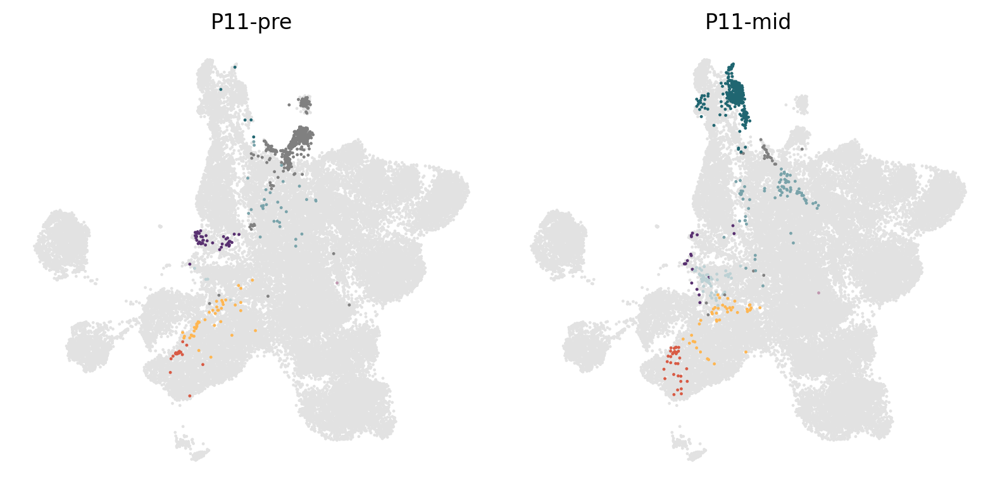

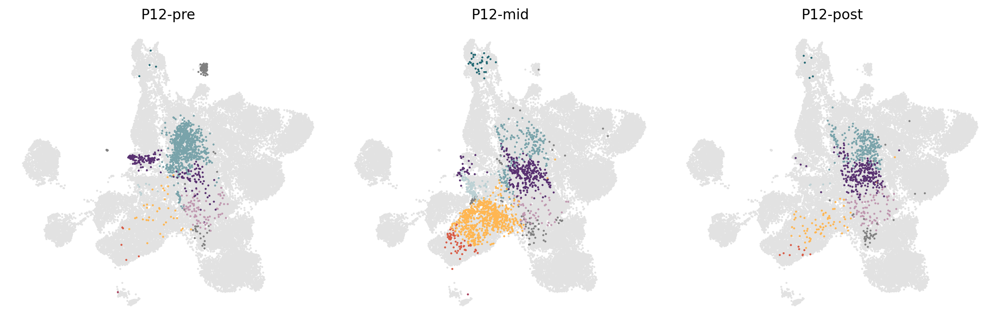

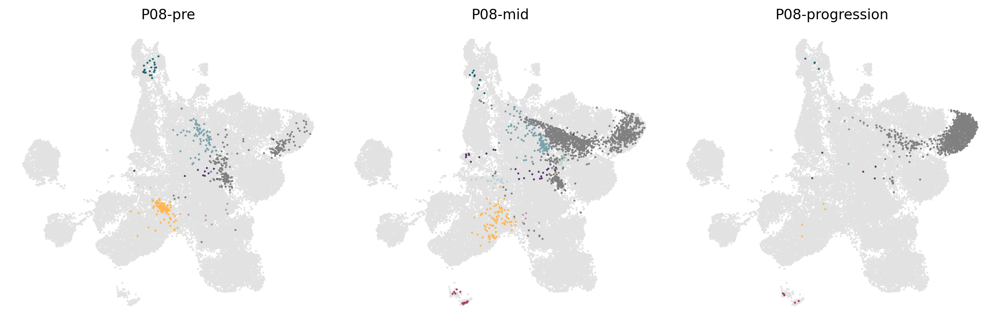

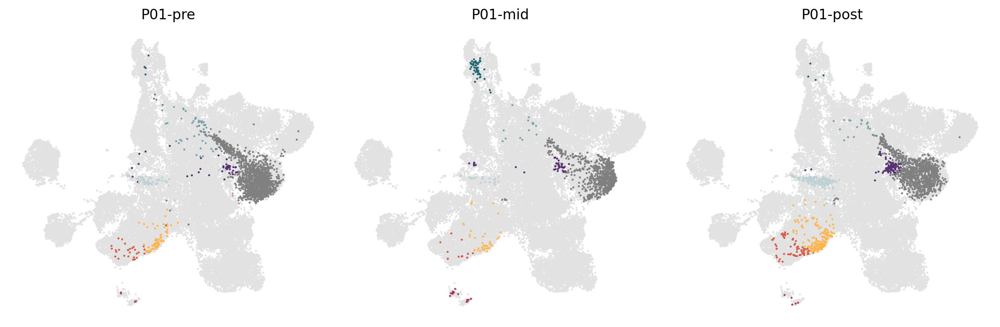

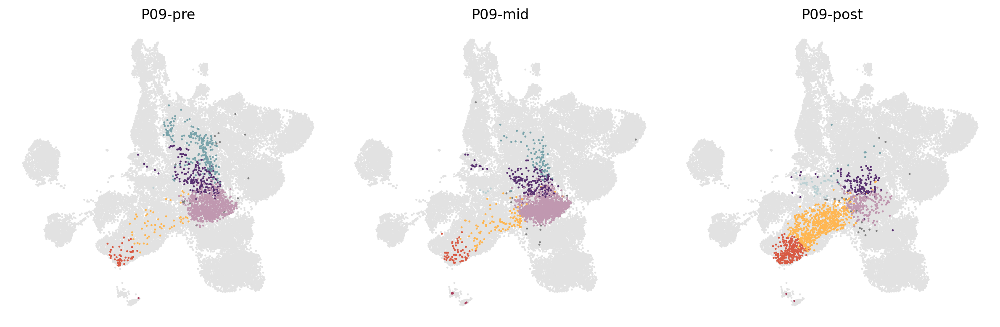

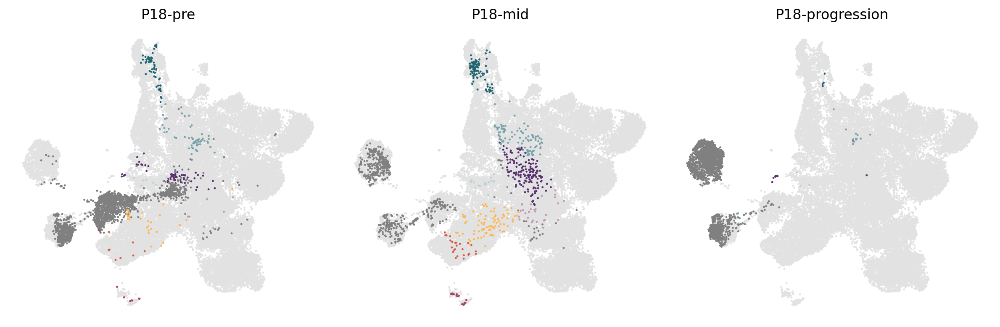

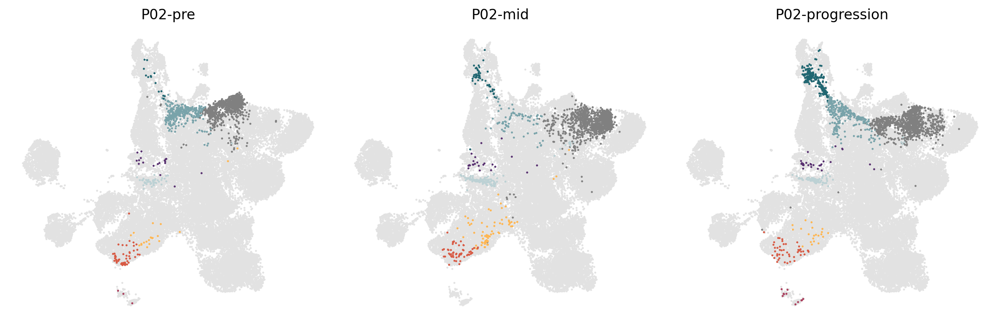

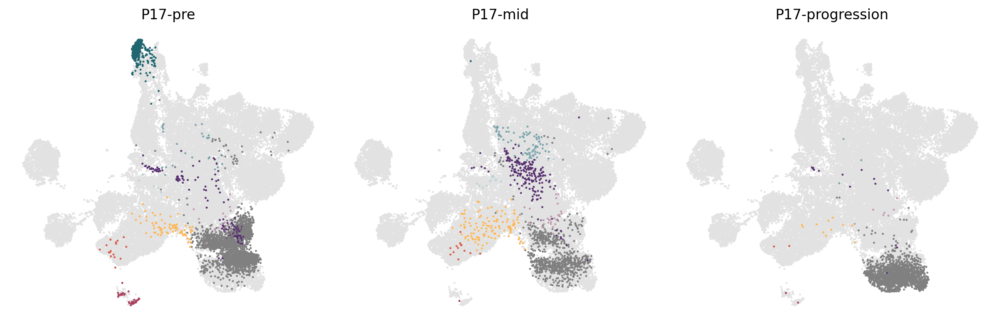

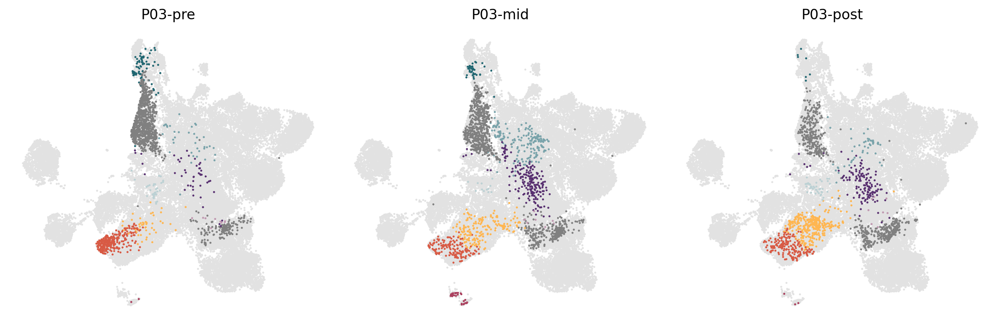

In [20]:
#Get the list of patients
patientlist = newdf['patient_alias'].unique()

#for each patient plot the cells pre, mid, post and progression

for i, pat_a in enumerate(patientlist):

    df=newdf[newdf['patient_alias'] == pat_a]
    sb = len(df['timepoint_coarse'].unique())
    fig,axes = plt.subplots(1,sb, figsize=((4*sb),4), dpi=200)

    c=0
    for j, timepoint in enumerate(['pre','mid','post','progression']):
        if df['timepoint_coarse'].str.contains(timepoint).any():
            ax = axes[c]
            ax.scatter(newdf['X_coord_umap'], newdf['Y_coord_umap'], c=newdf['ctgrey'], s=0.5, )
            ax.scatter(df[df['timepoint_coarse'] == timepoint]['X_coord_umap'], 
                df[df['timepoint_coarse'] == timepoint]['Y_coord_umap'],
                c=[new_celltype_colors2[celltype] for celltype in df[df['timepoint_coarse'] == timepoint]['celltype']], 
                s=3,
                edgecolor='none')
            plottitle= pat_a + '-' + timepoint
            ax.set_title(plottitle)
            ax.grid(False)
            ax.legend().set_visible(False)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.set_rasterization_zorder(0)
            ax.set(frame_on=False)
            c=c+1
        else:
            pass
        
    fig.tight_layout()
    fig.savefig("figures/"+str(pat_a)+"_timeplots_UMAP.pdf", format="pdf", bbox_inches='tight')